In [1]:
import gpflow.kernels
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

In [3]:
# Enzyme Toy Models
def toyModel(t,x, k):
    """
    Evaluate time-derivatives of the six concentrations in Yeung et al.'s kinetic model.
    """
    k1,k2,k3 = k
    dS0  = -k1*x[0]*x[3] + k2*x[1]
    dES0 =  k1*x[0]*x[3] - k2*x[1] - k3*x[1]
    dS1  =  k3*x[1] 
    dE   = -k1*x[3]*x[0] + k2*x[1] + k3*x[1] 
    return [dS0, dES0, dS1, dE]


def reducedToyModel(t,x, k):
    """
    Evaluate time-derivatives of the six concentrations in Yeung et al.'s kinetic model.
    """
    k1,k2,k3, E0 = k
    ke = (k1*k3)/(k2+ k3)
    dS0  = -ke*x[0]*E0
    dS1  = ke*x[0]*E0
    return [dS0, dS1]


def high_fidelity_toy(E):
    S0 = 5.0
    C0 = np.array([S0, 0.0, 0.0, E]) # initial concentrations of S0, ES0, ES1, S1, S2, E
    kvals = np.array([10, 50, 2])
    
    sol1 = solve_ivp(lambda t, x: toyModel(t, x, kvals), 
                         [0, 100], 
                         C0,
                         # t_eval=time_points, 
                         atol=np.sqrt(np.finfo(float).eps), 
                         rtol=np.sqrt(np.finfo(float).eps))
    return abs(10 - sol1.t[np.argmin(abs(sol1.y[2,:] - 0.67*S0))])


def low_fidelity_toy(E):
    S0 = 5.0
    C0 = np.array([S0, 0.0]) # initial concentrations of S0, ES0, ES1, S1, S2, E
    kvals = np.array([10, 50, 2, E])
    sol2 = solve_ivp(lambda t, x: reducedToyModel(t, x, kvals), 
                         [0, 100], 
                         C0[:2],
                         # t_eval=time_points, 
                         atol=np.sqrt(np.finfo(float).eps), 
                         rtol=np.sqrt(np.finfo(float).eps))
    return abs(10 - sol2.t[np.argmin(abs(sol2.y[1,:] - 0.67*S0))])

In [5]:
# Low and high fidelity functions
def low_fidelity_toy(x):
    return 0.5*((x*6-2.7)**2)*np.sin((x*6-2.5)*2)+(x-0.5)*10. - 5
#def low_fidelity_toy(x):
#    return 0.5*((x*6-2)**2)*np.sin((x*6-2)*2)+(x-0.5)*10. - 5

def high_fidelity_toy(x):
    return ((x*6-2)**2)*np.sin((x*6-2)*2)


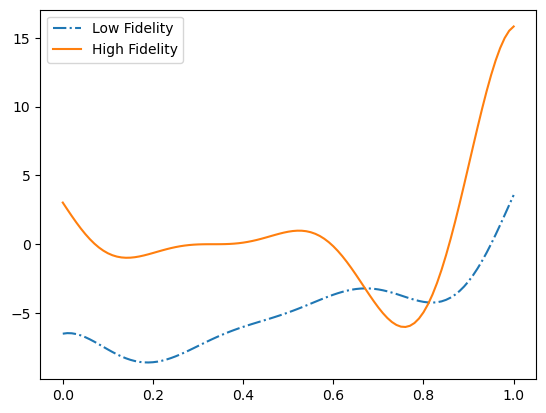

In [7]:
# Actual function
x = np.linspace(1.2, 0, 100, endpoint=False)[::-1]
x = np.linspace(0,1,101)

y0 = np.array([low_fidelity_toy(i) for i in x])
y1 = np.array([high_fidelity_toy(i) for i in x])

plt.plot(x, y0, label="Low Fidelity", linestyle='-.')
plt.plot(x, y1, label="High Fidelity")
plt.legend()
plt.show()

In [9]:
# Observer class

from trieste.data import Dataset, check_and_extract_fidelity_query_points

# Create an observer class to deal with multifidelity input query points
class Observer:
    def __init__(self, lf, hf):
        self.lowfidelity = lf
        self.highfidelity = hf

    def __call__(self, x):
        # Extract raw input and fidelity columns
        x_input, x_fidelity = check_and_extract_fidelity_query_points(x)

        # note: this assumes that my_simulator broadcasts, i.e. accept matrix inputs.
        # If not you need to replace this by a for loop over all rows of "input"
        observations = []
        for i in range(len(x_fidelity)):
            if x_fidelity[i] == 0:
                observations.append(self.lowfidelity(x_input[i][0]))
            if x_fidelity[i] == 1:
                observations.append(self.highfidelity(x_input[i][0]))
        observations = tf.convert_to_tensor(observations)
        observations = tf.reshape(observations, [len(x_fidelity),1])
        return Dataset(query_points=x, observations=observations)

# Instantiate the observer
observer = Observer(low_fidelity_toy, high_fidelity_toy)

In [11]:
# Search space
from trieste.space import Box

input_dim = 1
n_fidelities = 2

lb = np.zeros(input_dim)
ub = np.ones(input_dim)

input_search_space = Box(lb, ub)

In [13]:
# Initial dataset

from trieste.data import add_fidelity_column

# Define sample sizes of low, mid and high fidelities
sample_sizes = [6,3]

np.random.seed(1791)
tf.random.set_seed(1193)


xs = np.linspace(1.2, 0, sample_sizes[0], endpoint=False)[::-1]
xs = np.linspace(0, 1, sample_sizes[0], endpoint=True)
xs = tf.convert_to_tensor(xs)
xs = [tf.reshape(xs, [len(xs),1])]

# Take a subsample of each lower fidelity to sample at the next fidelity up
for fidelity in range(1, n_fidelities):
    samples = tf.Variable(
        np.random.choice(
            xs[fidelity - 1][:, 0], size=sample_sizes[fidelity], replace=False
        )
    )[:, None]
    xs.append(samples)
# Add fidelity columns to training data
initial_samples_list = [add_fidelity_column(x, i) for i, x in enumerate(xs)]

initial_sample = tf.concat(initial_samples_list, 0)
initial_data = observer(initial_sample)

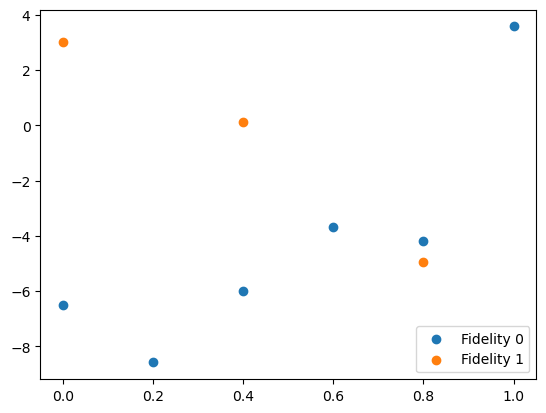

In [15]:
# Plot initial data
from trieste.data import split_dataset_by_fidelity

data = split_dataset_by_fidelity(initial_data, num_fidelities=n_fidelities)

plt.scatter(data[0].query_points, data[0].observations, label="Fidelity 0")
plt.scatter(data[1].query_points, data[1].observations, label="Fidelity 1")
plt.legend()
plt.show()

In [17]:
# Multifidelity model

from trieste.models.gpflow import (
    MultifidelityAutoregressive,
    build_multifidelity_autoregressive_models,
)

# Initialise model
multifidelity_model = MultifidelityAutoregressive(
    build_multifidelity_autoregressive_models(
        initial_data, n_fidelities, input_search_space
    )
)

# Update and optimize model
multifidelity_model.update(initial_data)
multifidelity_model.optimize(initial_data)

In [18]:
# Search space and actual function
x = np.linspace(1.2, 0, 100, endpoint=False)[::-1]
x = np.linspace(0, 1, 1000, endpoint=False)
X = tf.convert_to_tensor(x)
Xplot = tf.reshape(X, [len(x),1])
LF_function = observer(add_fidelity_column(Xplot, 0)).observations
HF_function = observer(add_fidelity_column(Xplot, 1)).observations

In [21]:
# Acquisition function

import tensorflow as tf
import numpy as np
from scipy.stats import norm

# Expected Improvement function
def expected_improvement(mean, variance, best_point):
    stddev = tf.sqrt(variance)
    
    # Avoid division by zero
    stddev = tf.where(stddev == 0, 1e-9, stddev)
    
    # Z score (normalized improvement)
    #Z = (mean - best_point) / stddev # Maximization
    Z = (best_point - mean) / stddev # Minimization
    
    # Compute the expected improvement using the CDF and PDF of the standard normal distribution
    #ei = (mean - best_point) * norm.cdf(Z) + stddev * norm.pdf(Z) # Maximization
    ei = (best_point - mean) * norm.cdf(Z) + 10*stddev * norm.pdf(Z) # Minimization
    
    # Ensure non-negative EI (EI is never negative)
    ei = tf.maximum(ei, 0)
    
    return ei

-8.77868291521693 6.5
-31.29799649773003 16.0
high fidelity
-8.77868291521693 3.75
-19.047932746897 8.5
high fidelity
-8.77868291521693 2.8333333333333335
-16.49376092901811 6.0
high fidelity
-8.77868291521693 2.375
-16.372068098038394 4.75
high fidelity
-8.77868291521693 2.1
-13.884541598367576 4.0
high fidelity
-8.77868291521693 1.9166666666666667
-13.075214411166863 3.5
high fidelity
-8.77868291521693 1.7857142857142858
-13.305434006123292 3.142857142857143
high fidelity
-8.77868291521693 1.6875
-13.254362511493277 2.875
high fidelity
-8.77868291521693 1.6111111111111112
-13.345818972682284 2.6666666666666665
high fidelity
-8.77868291521693 1.55
-13.51548907987743 2.5
high fidelity
-8.77868291521693 1.5
-13.594796844225591 2.3636363636363638
high fidelity
-8.77868291521693 1.4583333333333333
-13.665686866582393 2.25
high fidelity
-8.77868291521693 1.4230769230769231
-13.630947008214514 2.1538461538461537
high fidelity
-8.77868291521693 1.3928571428571428
-13.56726320894787 2.0714285

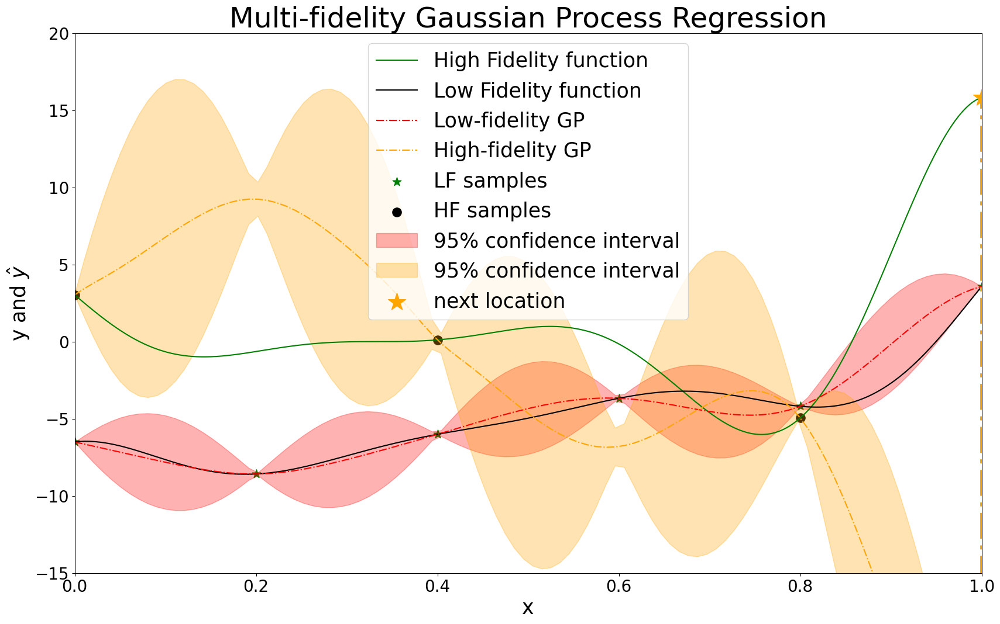

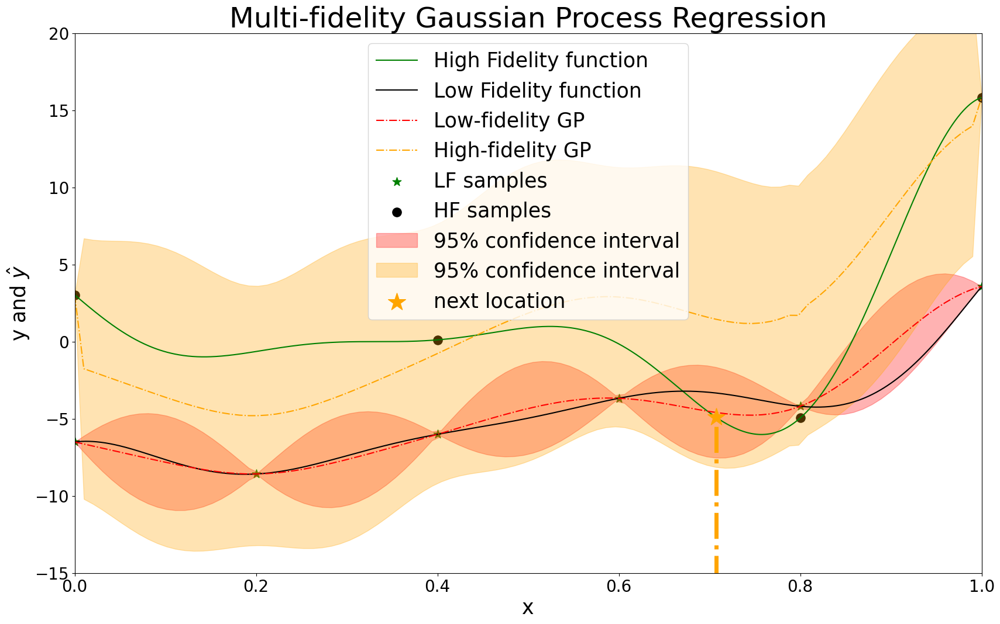

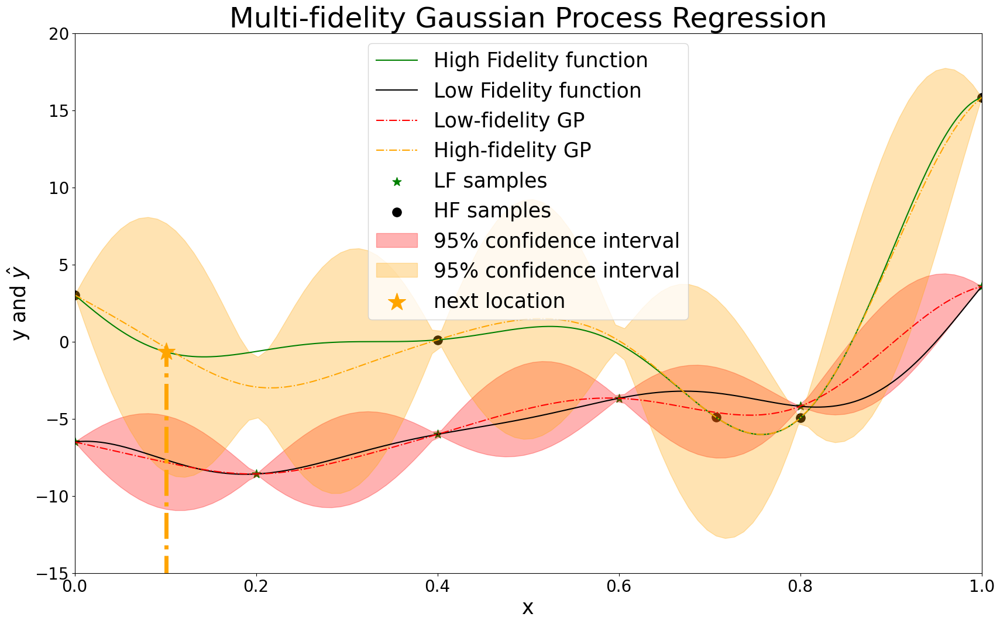

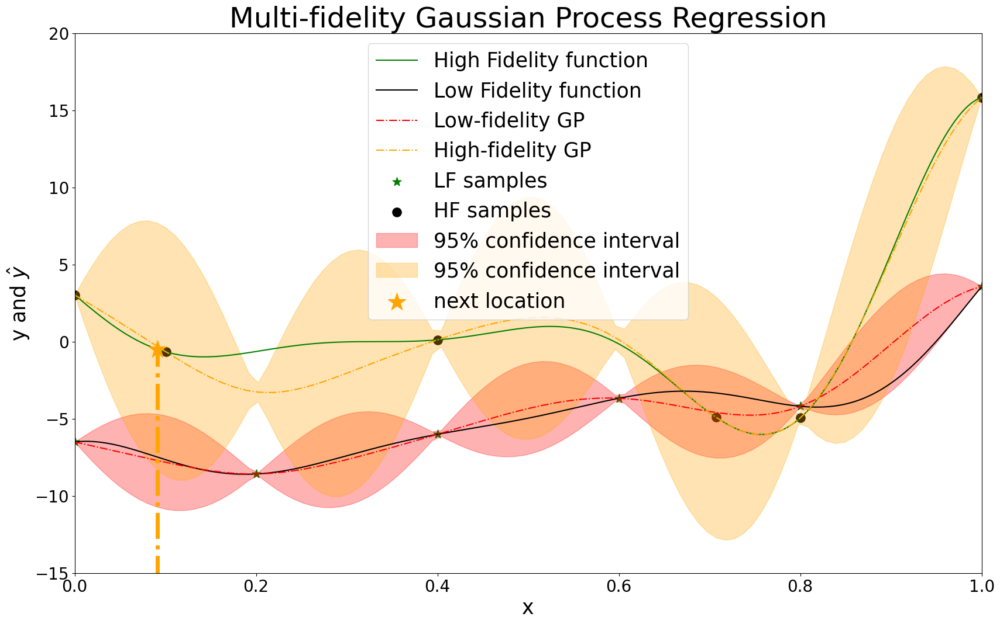

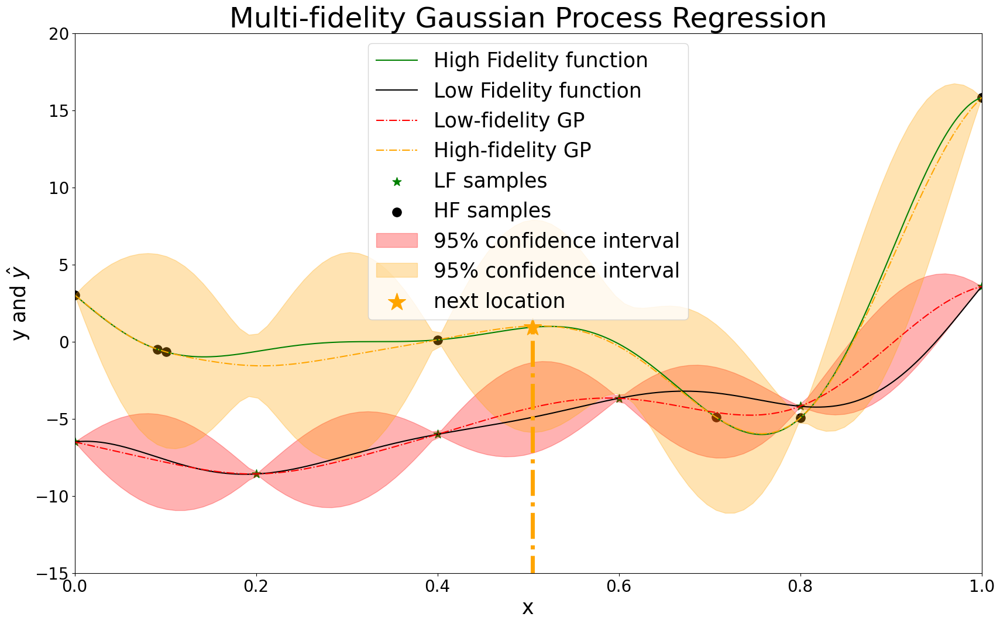

...

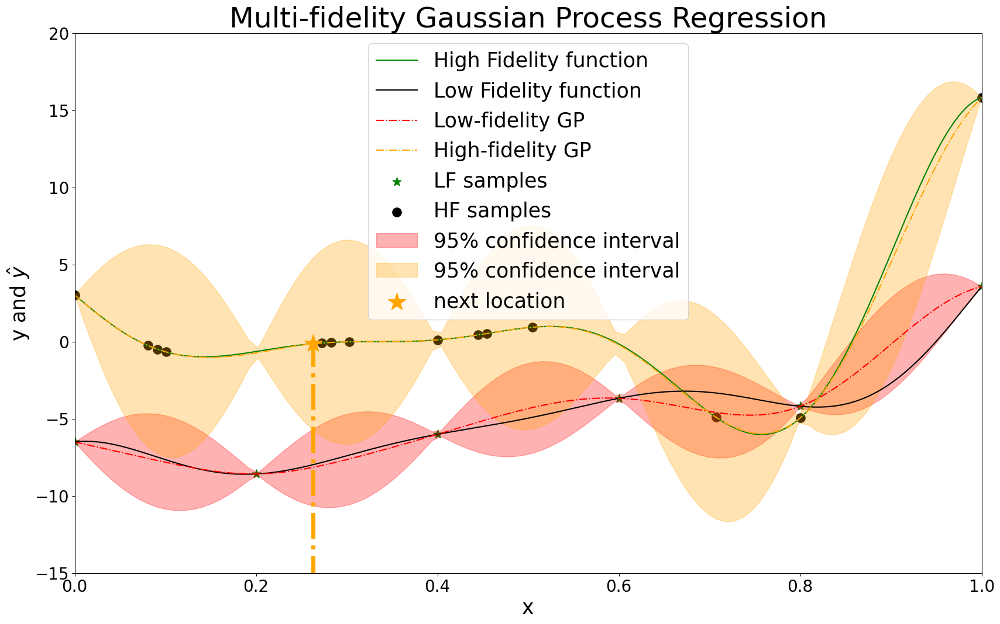

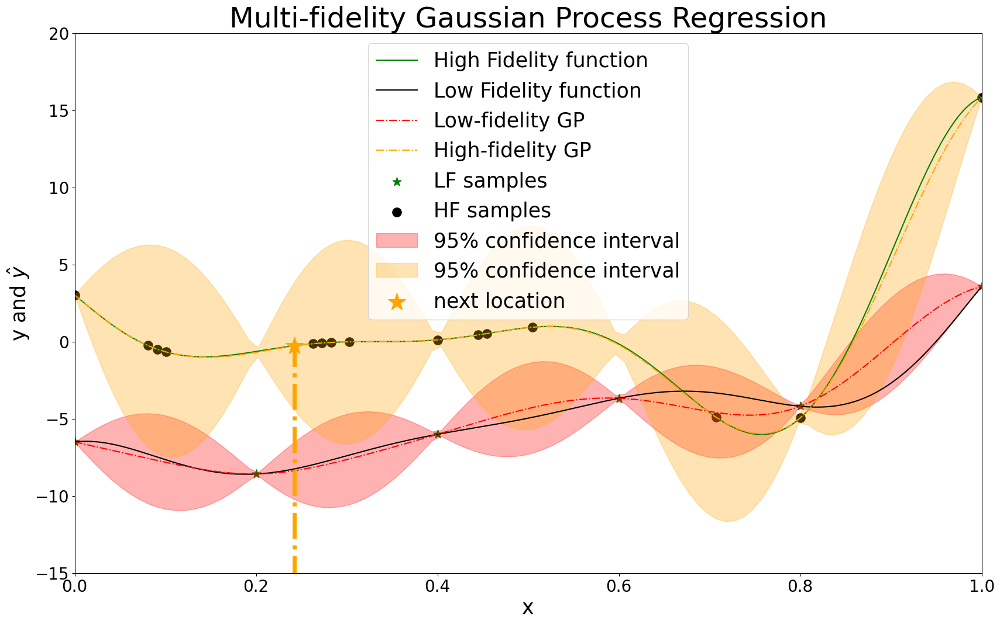

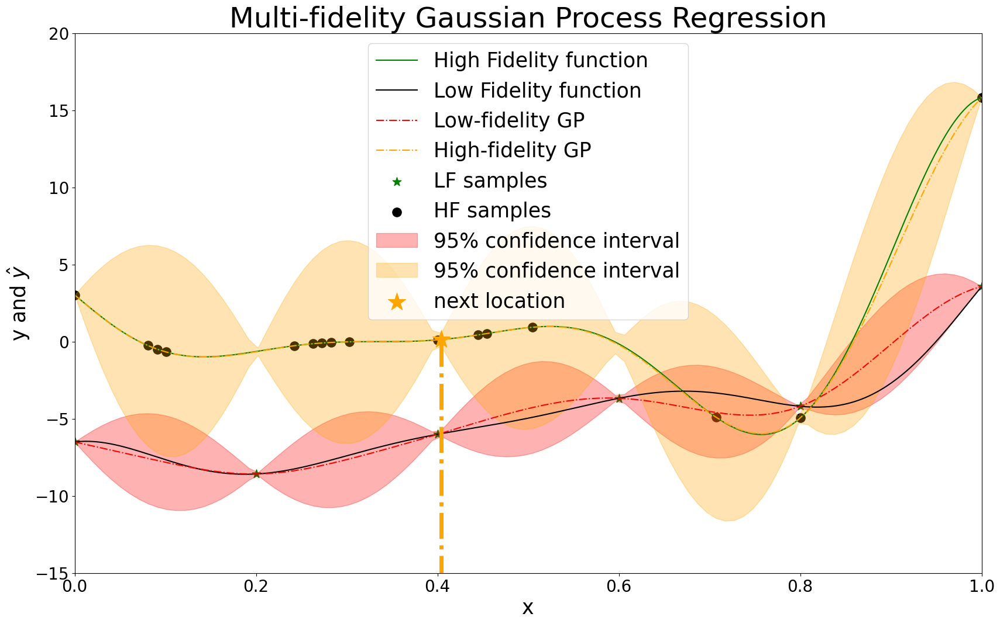

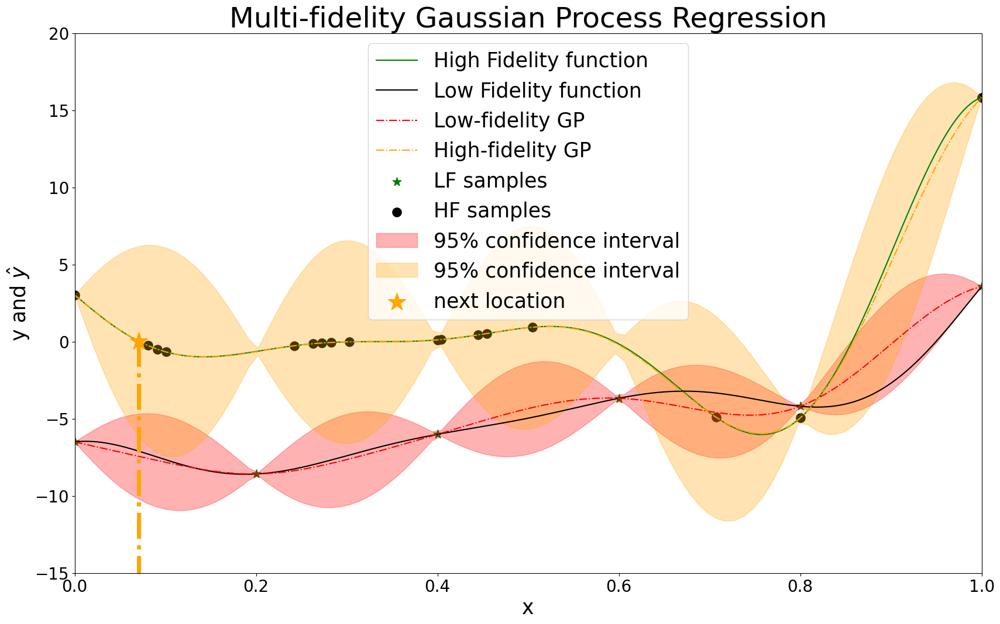

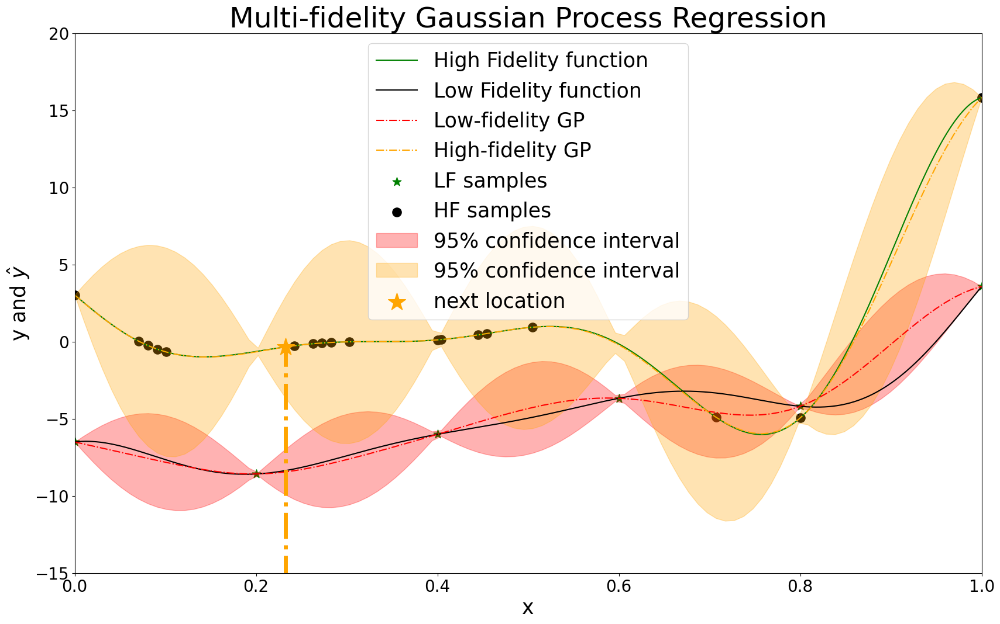

In [23]:
# Fidelity Weighted Cost function and active learning
n1, n2 = 6,3
n_iter = 0
b1,b2 = 1, 2

x = np.linspace(1.2, 0, 100, endpoint=False)[::-1]
x = np.linspace(0, 1, 100, endpoint=True)
X = tf.convert_to_tensor(x)
X = tf.reshape(X, [len(x),1])

data = observer(initial_sample)

# Animation data
GP_mean_h_list =[]
GP_mean_l_list=[]
GP_variance_h_list =[]
GP_variance_l_list=[]
Xt_e_list=[]
Xt_c_list=[]
xnew_list=[]
yt_e_list=[]
yt_c_list=[]
ynew_list=[]
fidelitylist = []

# Optimization iterations
for i in range(16):
    n_iter += 1
    # Multi-fidelity GPR
    multifidelity_model = MultifidelityAutoregressive(
    build_multifidelity_autoregressive_models(data, n_fidelities, input_search_space))
    multifidelity_model.update(data)
    multifidelity_model.optimize(data)
    
    # High-fidelity GP mean and variance
    GP_l_mean, GP_l_var = multifidelity_model.predict(add_fidelity_column(X, 0))
    GP_h_mean, GP_h_var = multifidelity_model.predict(add_fidelity_column(X, 1))
    

    datapts = split_dataset_by_fidelity(data, num_fidelities=n_fidelities)
    bp_h = datapts[1].query_points[np.argmin(datapts[1].observations)]
    bp_l = datapts[0].query_points[np.argmin(datapts[0].observations)]

    phi_h = -expected_improvement(GP_h_mean, GP_h_var, bp_h)
    phi_l = -expected_improvement(GP_l_mean, GP_l_var, bp_l)
    
    plt.figure(figsize=(20, 12))
    plt.plot(Xplot, HF_function, c='g', label ='High Fidelity function')
    plt.plot(Xplot, LF_function , c ='k', label ='Low Fidelity function')
    plt.plot(X, GP_l_mean, linestyle = '-.' , label='Low-fidelity GP', color='red')
    plt.plot(X, GP_h_mean, linestyle = '-.' , label='High-fidelity GP', color='orange')

    plt.scatter(datapts[0].query_points, datapts[0].observations, marker = '*' , color ='g', label ='LF samples', s=120)
    plt.scatter(datapts[1].query_points, datapts[1].observations, marker = 'o' , color ='k', label ='HF samples', s=120)


    GP_l_mean = np.array(GP_l_mean).ravel()
    GP_l_var = np.array(GP_l_var).ravel()
    GP_h_mean = np.array(GP_h_mean).ravel()
    GP_h_var = np.array(GP_h_var).ravel()

    plt.fill_between(
        np.array(X).ravel(),
        GP_l_mean - 1.96 * tf.math.sqrt(GP_l_var),
        GP_l_mean + 1.96 * tf.math.sqrt(GP_l_var),
        alpha=0.3,
        label=r"95% confidence interval",
        color='red')

    plt.fill_between(
        np.array(X).ravel(),
        GP_h_mean - 1.96 * tf.math.sqrt(GP_h_var),
        GP_h_mean + 1.96 * tf.math.sqrt(GP_h_var),
        alpha=0.3,
        label=r"95% confidence interval",
        color='orange')

    obs = np.array(data.observations)
    qpts = np.array(data.query_points)

    # Fidelity weighted cost
    cost_l = ((b1/b2)*(n1 + 1) + n2)/n_iter
    cost_h = ((b2/b1)*(n1) +  (n2 + 1))/n_iter

    print(np.min(phi_l), np.max(cost_l))
    print(np.min(phi_h), np.max(cost_h))

    phi_l += cost_l
    phi_h += cost_h
    
    if np.min(phi_h) < np.min(phi_l):
        print('high fidelity')
        xnew = np.array(X)[np.argmin(phi_h)]
        rec = False
        if np.any([np.all([xnew[0],1] == i) for i in qpts]):
            rec = True
            phii = np.array(phi_h).copy()
        
        while rec == True:
            phii = np.delete(phii, np.argmin(phii)) 
            xnew = np.array(X)[np.argmin(phii)]
            if not np.any([np.all([xnew[0],1] == i) for i in qpts]):
                rec = False
        ynew = high_fidelity_toy(xnew[0])
        fidelitynew = 1
        n2 += 1

    else:
        print('low-fidelity')
        xnew = np.array(X)[np.argmin(phi_l)]
        rec = False
        if np.any([np.all([xnew[0],0] == i) for i in qpts]):
            rec = True
            phii = np.array(phi_l).copy()
        
        while rec == True:
            phii = np.delete(phii, np.argmin(phii)) 
            xnew = np.array(X)[np.argmin(phii)]
            if not np.any([np.all([xnew[0],0] == i) for i in qpts]):
                rec = False
                
        ynew = low_fidelity_toy(xnew[0])
        n1 += 1
        fidelitynew = 0

    obs = np.vstack([obs, ynew])
    qpts = np.vstack([qpts, [xnew[0], fidelitynew]])

    data = Dataset(query_points=qpts, observations=obs)

    if fidelitynew == 0:
        plt.scatter(xnew, ynew, marker = '*' , color ='r', label ='next location', s=500, zorder=2)
        plt.vlines(xnew, -20, ynew, linestyle='-.', linewidth=5, color='r')
    if fidelitynew == 1:
        plt.scatter(xnew, ynew, marker = '*' , color ='orange', label ='next location', s=500, zorder=2)
        plt.vlines(xnew, -20, ynew, linestyle='-.', linewidth=5, color='orange')
        
    plt.ylim(-15, 20)
    plt.xlim(X[0], 1)
    #plt.xlim(X[0], 1.2)
    #plt.ylim(-20, 90)
    
    
    plt.legend(fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xlabel('x', fontsize=25)
    plt.ylabel(r'y and $\hat{y}$', fontsize=25)

    plt.title('Multi-fidelity Gaussian Process Regression', fontsize=35)

    datapts = split_dataset_by_fidelity(data, num_fidelities=n_fidelities)
    Xt_c, yt_c = datapts[0].query_points, datapts[0].observations
    Xt_e, yt_e = datapts[1].query_points, datapts[1].observations

    GP_mean_h_list.append(GP_h_mean)
    GP_mean_l_list.append(GP_l_mean)
    GP_variance_h_list.append(GP_h_var)
    GP_variance_l_list.append(GP_l_var)
    Xt_e_list.append(Xt_e)
    Xt_c_list.append(Xt_c)
    xnew_list.append(xnew)
    yt_e_list.append(yt_e)
    yt_c_list.append(yt_c)
    ynew_list.append(ynew)
    fidelitylist.append(fidelitynew)

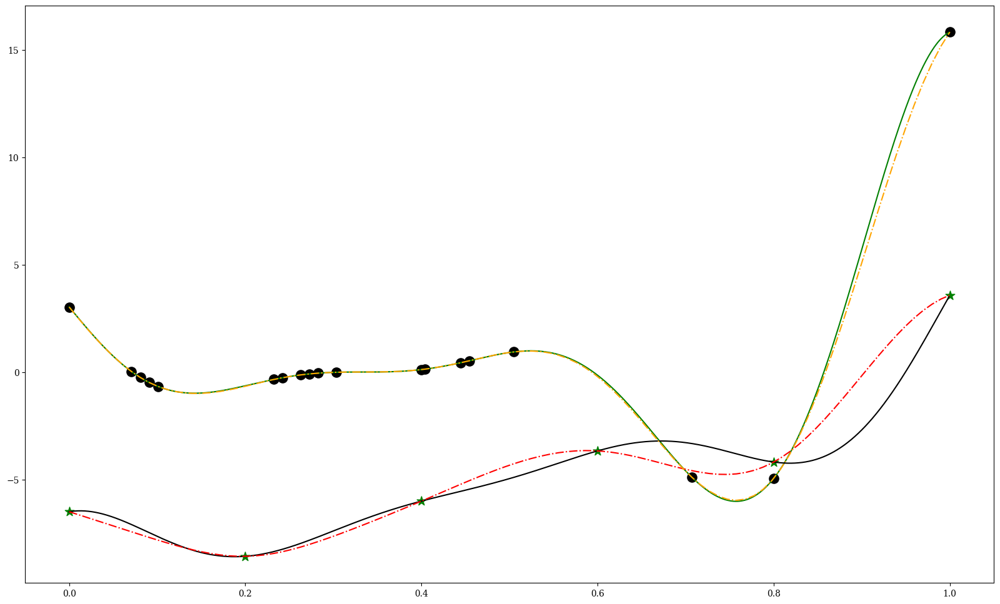

In [1168]:
plt.figure(figsize=(20, 12))
plt.plot(Xplot, HF_function, c='g', label ='High Fidelity function')
plt.plot(Xplot, LF_function , c ='k', label ='Low Fidelity function')
plt.plot(X, GP_l_mean, linestyle = '-.' , label='Low-fidelity GP', color='red')
plt.plot(X, GP_h_mean, linestyle = '-.' , label='High-fidelity GP', color='orange')

plt.scatter(datapts[0].query_points, datapts[0].observations, marker = '*' , color ='g', label ='LF samples', s=120)
plt.scatter(datapts[1].query_points, datapts[1].observations, marker = 'o' , color ='k', label ='HF samples', s=120)

In [1155]:
X[]

<tf.Tensor: shape=(1,), dtype=float64, numpy=array([0.7979798])>

In [556]:
blist = np.linspace(20, 0, 100, endpoint=False)[::-1]

In [560]:
blist[50:]

array([10.2, 10.4, 10.6, 10.8, 11. , 11.2, 11.4, 11.6, 11.8, 12. , 12.2,
       12.4, 12.6, 12.8, 13. , 13.2, 13.4, 13.6, 13.8, 14. , 14.2, 14.4,
       14.6, 14.8, 15. , 15.2, 15.4, 15.6, 15.8, 16. , 16.2, 16.4, 16.6,
       16.8, 17. , 17.2, 17.4, 17.6, 17.8, 18. , 18.2, 18.4, 18.6, 18.8,
       19. , 19.2, 19.4, 19.6, 19.8, 20. ])

In [568]:
# Fidelity Weighted Cost function and active learning
#nhlist = []
#nllist = []
for j in blist[50:]:
    beta1, beta2 = 500, 20
    n1, n2 = 6,3
    n_iter = 0
    b1,b2 = j, 1
    
    x = np.linspace(1.2, 0, 100, endpoint=False)[::-1]
    x = np.linspace(0, 1, 100, endpoint=True)
    X = tf.convert_to_tensor(x)
    X = tf.reshape(X, [len(x),1])
    
    data = observer(initial_sample)
    
    
    GP_mean_h_list =[]
    GP_mean_l_list=[]
    GP_variance_h_list =[]
    GP_variance_l_list=[]
    Xt_e_list=[]
    Xt_c_list=[]
    xnew_list=[]
    yt_e_list=[]
    yt_c_list=[]
    ynew_list=[]
    fidelitylist = []
    
    
    for i in range(16):
        n_iter += 1
        # Multi-fidelity GPR
        multifidelity_model.update(data)
        multifidelity_model.optimize(data)
        
        # High-fidelity GP mean and variance
        GP_l_mean, GP_l_var = multifidelity_model.predict(add_fidelity_column(X, 0))
        GP_h_mean, GP_h_var = multifidelity_model.predict(add_fidelity_column(X, 1))
    
        GP_l_mean = np.array(GP_l_mean).ravel()
        GP_h_mean = np.array(GP_h_mean).ravel()
        GP_l_var = np.array(GP_l_var).ravel()
        GP_h_var = np.array(GP_h_var).ravel()
        
        
        phi_l = GP_l_mean - beta1 * GP_l_var
        phi_h = GP_h_mean - beta2 * GP_h_var
        
        
       
    
        datapts = split_dataset_by_fidelity(data, num_fidelities=n_fidelities)
    
    
        obs = np.array(data.observations)
        qpts = np.array(data.query_points)
    
        # Fidelity weighted cost
        cost_l = ((b1/b2)*(n1 + 1) + n2)/n_iter
        cost_h = ((b2/b1)*(n1) +  (n2 + 1))/n_iter
        
    
        #print(np.min(phi_l), np.max(cost_l))
        #print(np.min(phi_h), np.max(cost_h))
    
    
        phi_l += cost_l
        phi_h += cost_h
        
        if np.min(phi_h) < np.min(phi_l):
            #print('high fidelity')
            xnew = np.array(X)[np.argmin(phi_h)]
            ynew = high_fidelity_toy(xnew[0])
            fidelitynew = 1
            n2 += 1
            
        else:
            #print('low-fidelity')
            xnew = np.array(X)[np.argmin(phi_l)]
            ynew = low_fidelity_toy(xnew[0])
            n1 += 1
            fidelitynew = 0
    
        obs = np.vstack([obs,ynew])
        qpts = np.vstack([qpts, [xnew[0], fidelitynew]])
    
        data = Dataset(query_points=qpts, observations=obs)
    
        
        datapts = split_dataset_by_fidelity(data, num_fidelities=n_fidelities)
        Xt_c, yt_c = datapts[0].query_points, datapts[0].observations
        Xt_e, yt_e = datapts[1].query_points, datapts[1].observations
    
        GP_mean_h_list.append(GP_h_mean)
        GP_mean_l_list.append(GP_l_mean)
        GP_variance_h_list.append(GP_h_var)
        GP_variance_l_list.append(GP_l_var)
        Xt_e_list.append(Xt_e)
        Xt_c_list.append(Xt_c)
        xnew_list.append(xnew)
        yt_e_list.append(yt_e)
        yt_c_list.append(yt_c)
        ynew_list.append(ynew)
        fidelitylist.append(fidelitynew)
    print(j)
    nhlist.append(n2)
    nllist.append(n1)

10.2
10.399999999999999
10.6
10.799999999999999
11.0
11.2
11.4
11.6
11.799999999999999
12.0
12.2
12.399999999999999
12.6
12.8
13.0
13.2
13.399999999999999
13.6
13.8
14.0
14.2
14.399999999999999
14.6
14.8
15.0
15.2
15.399999999999999
15.6
15.8
16.0
16.2
16.4
16.6
16.8
17.0
17.2
17.4
17.6
17.8
18.0
18.2
18.4
18.6
18.8
19.0
19.2
19.4
19.6
19.8
20.0


In [566]:
nhlist = list(nhlist)
nllist = list(nllist)

In [570]:
nhlist = np.array(nhlist)
nlist = np.array(nllist)
nhlist

array([ 4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
        4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
        4,  7,  7,  7,  7,  7,  7,  8,  8,  9,  9,  9,  9,  9,  9,  9,  9,
        9,  9,  9,  9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
       10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
       10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10])

Text(0, 0.5, '$n_{high}$/$n_{low}$')

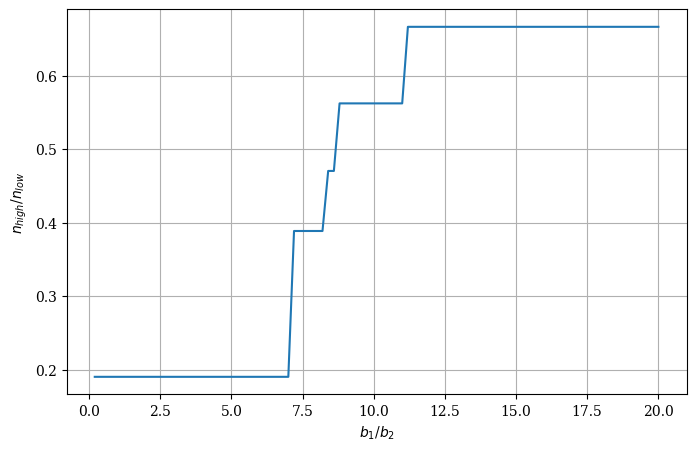

In [572]:
#plt.plot(blist, nhlist)
plt.rc('font', family='serif')
plt.figure(figsize=(8, 5))
plt.plot(blist, nhlist/nllist)
plt.grid(True)
plt.xlabel(r'$b_1$/$b_2$')
plt.ylabel(r'$n_{high}$/$n_{low}$')


In [482]:
ei = trieste.acquisition.ExpectedImprovement().using(multifidelity_model)

In [488]:
ei = trieste.acquisition.ExpectedImprovement().using(multifidelity_model)

# Generate new query points for evaluating EI (let's use 100 evenly spaced points between 0 and 1)
new_query_points = tf.linspace([0.0], [1.0], 100)

# Evaluate the Expected Improvement at these points
ei_values = ei.acquire(new_query_points)

AttributeError: '_Anon' object has no attribute 'acquire'

0
0
1
2
3
4
5
6
7
8
9
10
11
12
0


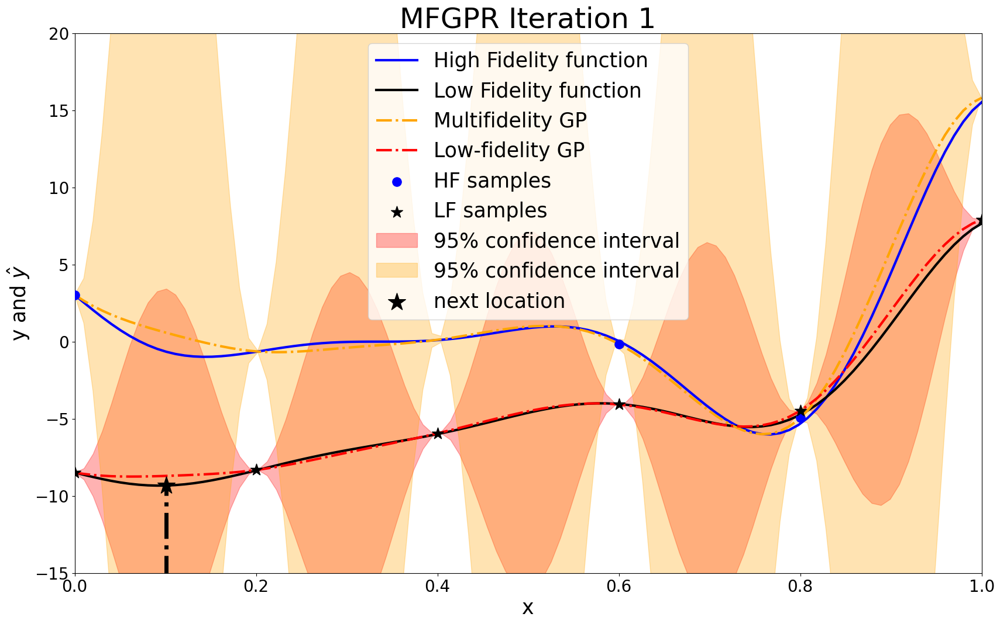

In [424]:
fig = plt.figure(figsize=(20, 12))
fig.clear()

# Animation Function 
def animate(i):  
    """This function will be called by the animation function iteratively to plot"""
    print(i)
    fig.clear()

    lw=3
    
    plt.plot(X, HF_function, label ='High Fidelity function', c='blue', lw=lw)
    plt.plot(X, LF_function , c ='k', label ='Low Fidelity function', lw=lw)
    plt.plot(X, GP_mean_h_list[i], linestyle = '-.' , label='Multifidelity GP', color='orange', lw=lw)
    plt.plot(X, GP_mean_l_list[i], linestyle = '-.' , label='Low-fidelity GP', color='red', lw=lw)
    
    plt.scatter(Xt_e_list[i], yt_e_list[i], marker = 'o' , color ='blue', label ='HF samples', s=120, zorder=3)
    plt.scatter(Xt_c_list[i], yt_c_list[i], marker = '*' , color ='k', label ='LF samples', s=220, zorder=4)

    plt.fill_between(
        x.ravel(),
        GP_mean_l_list[i] - 1.96 * (GP_variance_l_list[i]),
        GP_mean_l_list[i] + 1.96 * (GP_variance_l_list[i]),
        alpha=0.3,
        label=r"95% confidence interval",
        color='red')
    

    plt.fill_between(
        x.ravel(),
        GP_mean_h_list[i] - 1.96 * (GP_variance_h_list[i]),
        GP_mean_h_list[i] + 1.96 * (GP_variance_h_list[i]),
        alpha=0.3,
        label=r"95% confidence interval",
        color='orange')


    if fidelitylist[i] == 0:
        plt.scatter(xnew_list[i], ynew_list[i], marker = '*' , color ='k', label ='next location', s=500, zorder=2)
        plt.vlines(xnew_list[i], -20, ynew_list[i], linestyle='-.', linewidth=5, color='k')
    if fidelitylist[i] == 1:
        plt.scatter(xnew_list[i], ynew_list[i], marker = '*' , color ='b', label ='next location', s=500, zorder=2)
        plt.vlines(xnew_list[i], -20, ynew_list[i], linestyle='-.', linewidth=5, color='b')

    plt.ylim(-15, 20)
    plt.xlim(X[0], 1)
    
    #plt.ylim(-20, 90)
    #plt.xlim(X[0], 1.2)
    
    plt.legend(fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xlabel('x', fontsize=25)
    plt.ylabel(r'y and $\hat{y}$', fontsize=25)

    plt.title('MFGPR Iteration {}'.format(i+1), fontsize=35)
    
    
ani = animation.FuncAnimation(fig, animate, frames=(len(xnew_list))) #animation function. frames will iterate i in animate
ani.save('MFGP_toy.gif', writer='pillow', fps=1) #save animation
    

In [185]:
from matplotlib import animation

In [ ]:
#MFGPUCB

In [440]:
import numpy as np
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C

# Sample training data
data = observer(initial_sample)


In [442]:
Xt_c, Xt_e, yt_c, yt_e = np.array(data.query_points)[:6,0], np.array(data.query_points)[6:, 0], np.array(data.observations)[:6], np.array(data.observations)[6:]

In [444]:
Xt_c, Xt_e, yt_c, yt_e

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
 array([0.8, 0. , 0.6]),
 array([[-8.48639501],
        [-8.31986355],
        [-5.94261151],
        [-4.0747189 ],
        [-4.47456522],
        [ 7.91486597]]),
 array([[-4.94913044],
        [ 3.02720998],
        [-0.14943781]]))

/opt/anaconda3/lib/python3.11/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.0001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.0001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.0001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/gaussian_process/kernels.py:42

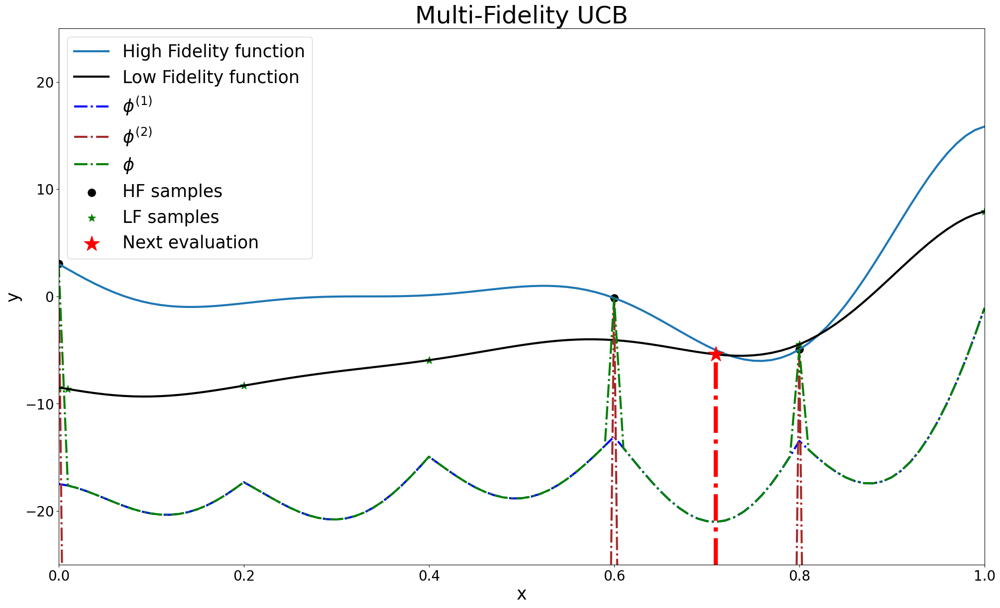

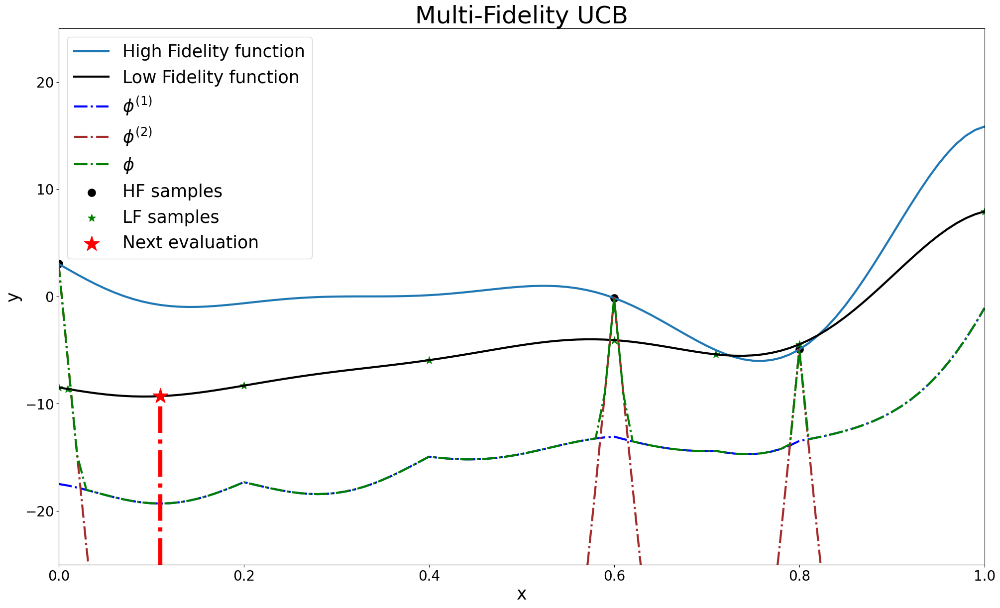

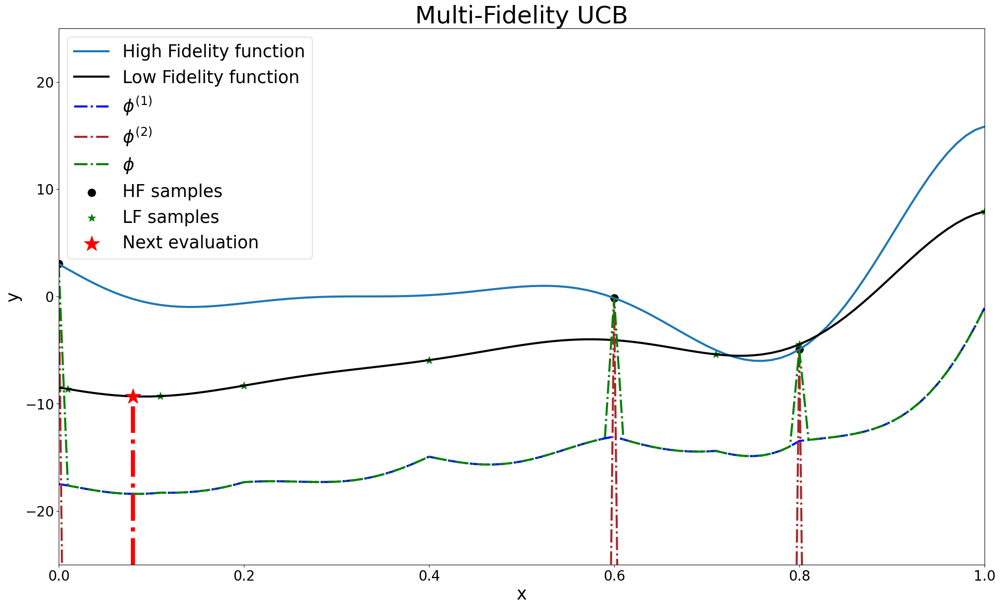

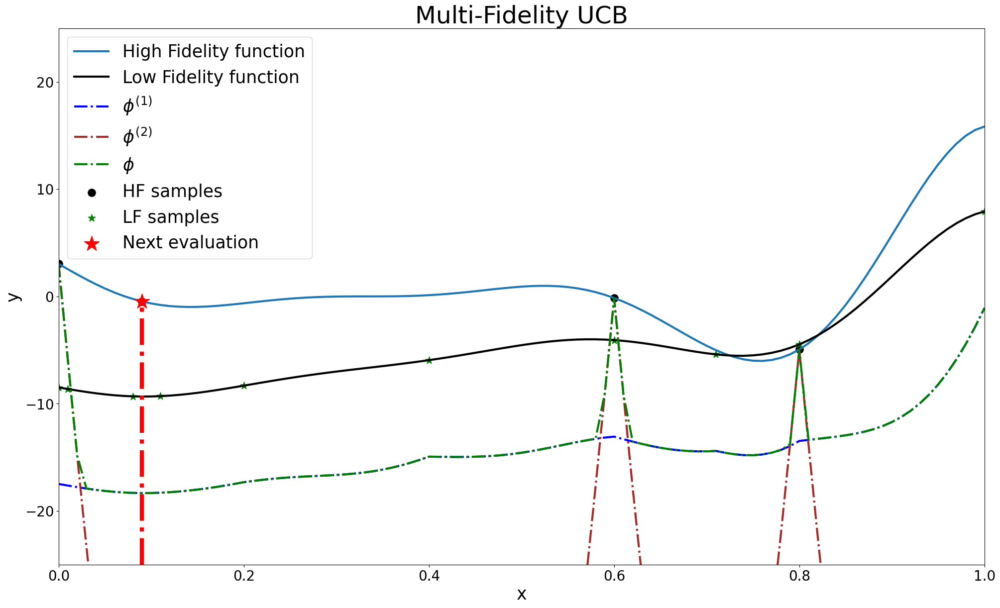

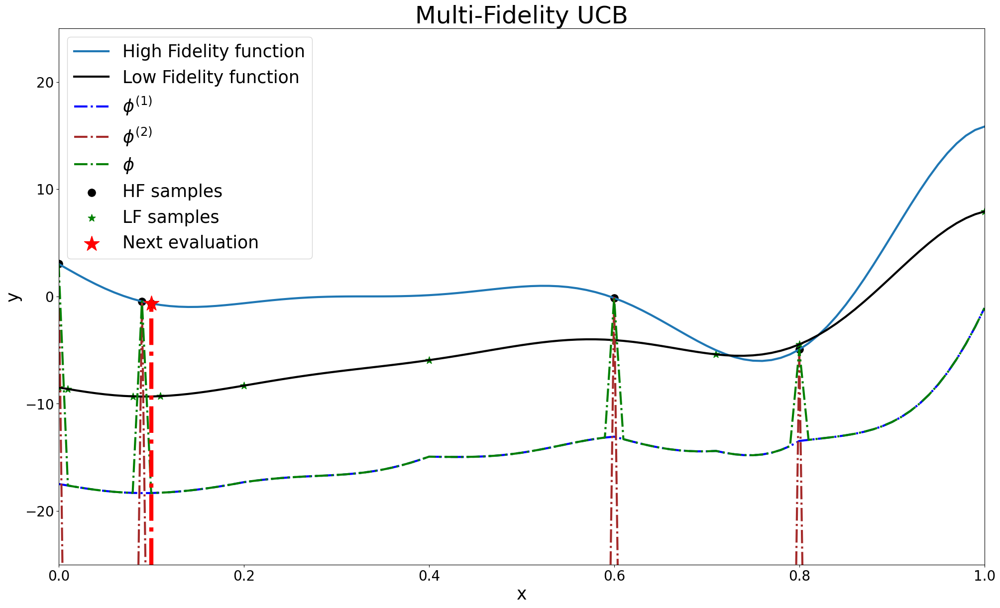

...

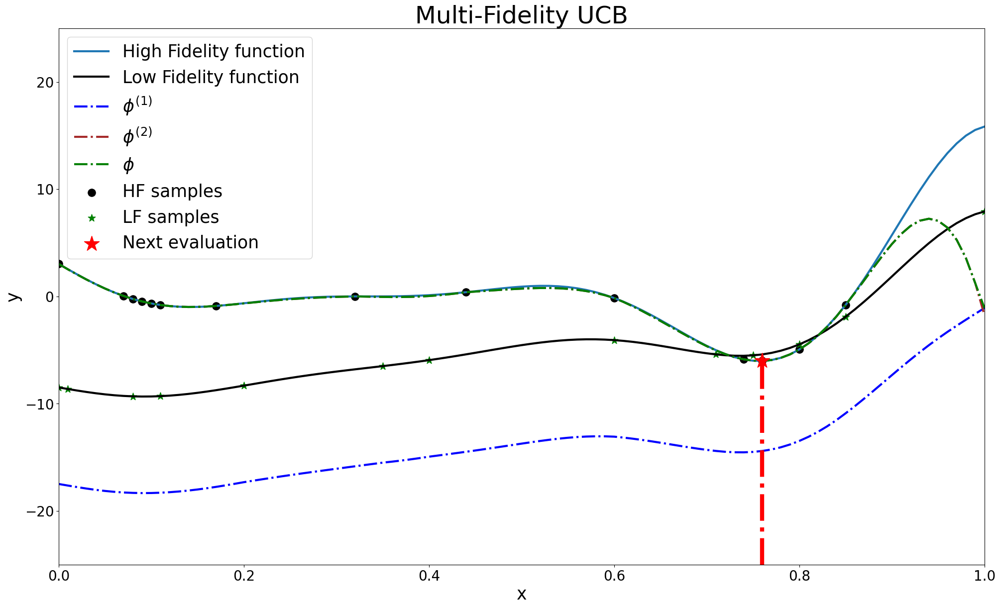

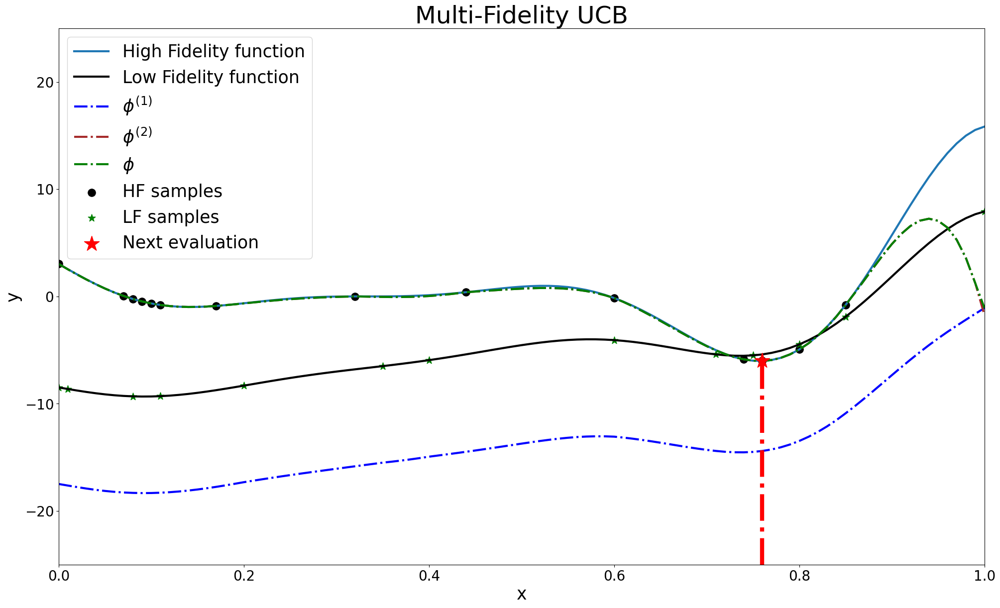

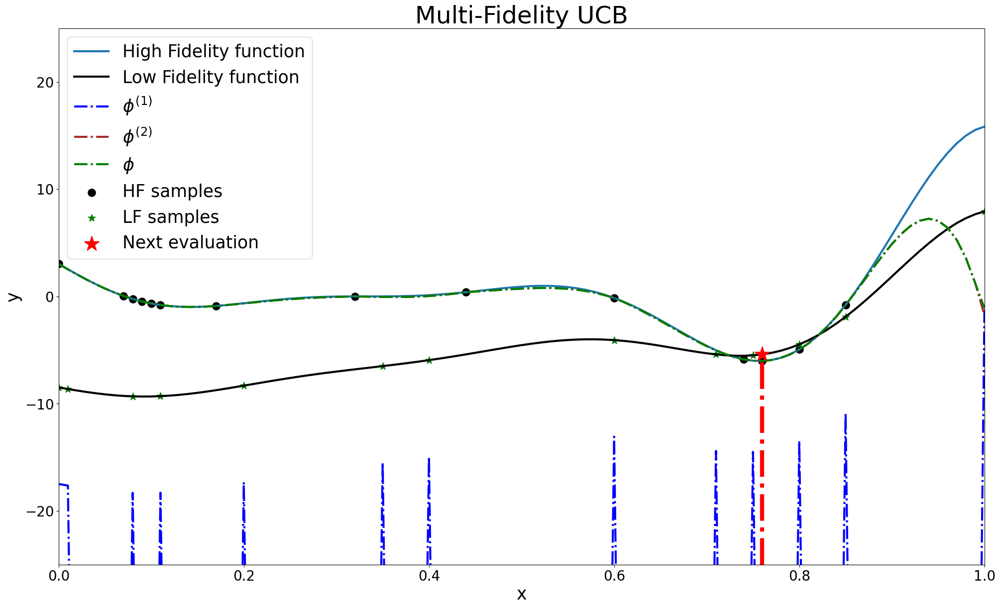

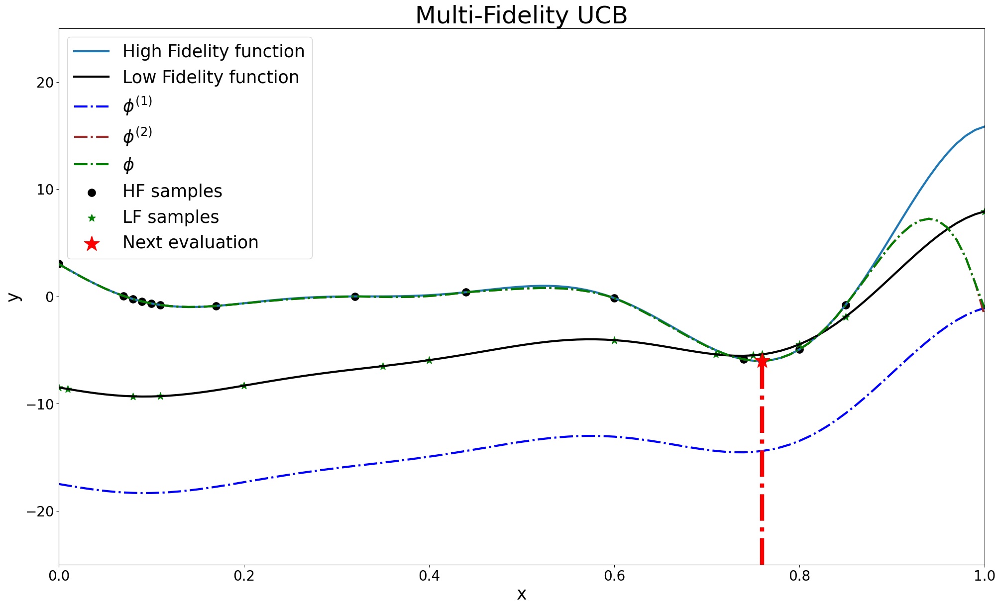

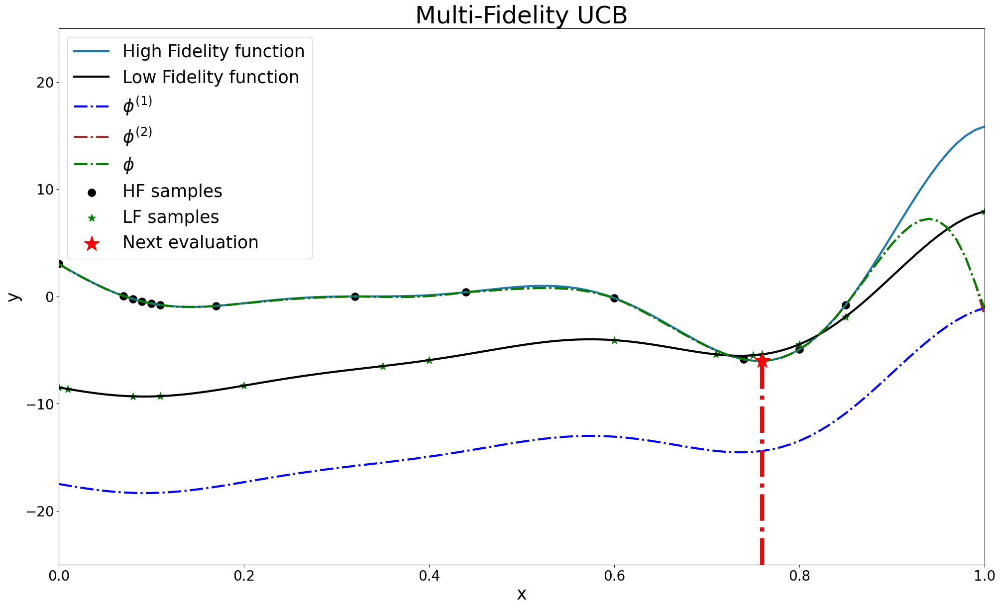

In [412]:
# Initial samples
x = np.linspace(0, 1, 101, endpoint = True).reshape(-1,1)
ndim=1
Xt_c = Xt_c.reshape(-1, ndim)

Xt_e = Xt_e.reshape(-1, ndim)

    
# Evaluate the HF and LF functions
yt_e = high_fidelity_toy(Xt_e)
yt_c = low_fidelity_toy(Xt_c)



e = np.array([9])
l = np.array([0.0001, 1])
v = np.array([e[i]*np.sqrt(l[i]/l[i+1]) for i in range(e.size)])

b = 100
b2 = 500
n1, n2 = 0,0


phi_1_list =[]
phi_2_list=[]
phi_list=[]
Xt_e_list=[]
Xt_c_list=[]
xnew_list=[]
yt_e_list=[]
yt_c_list=[]
ynew_list=[]
fidelitylist = []


lw = 3

for i in range(22):
    n_iter += 1
    # Low fidelity GP

    # Define the kernel: ConstantKernel * RBF
    kernel = C(1.0, (1e-4, 1e4)) * RBF(1, (1e-4, 1e4))
    
    # Create GaussianProcessRegressor
    gp1 = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)
    
    # Fit to the training data
    gp1.fit(Xt_c, -yt_c)

    GP_mean_1, GP_sig_1 = gp1.predict(x, return_std=True)
    
    phi_1 = GP_mean_1 + np.sqrt(b) * GP_sig_1 + e

    # High-fidelity GP
    # Create GaussianProcessRegressor
    gp2 = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)
    
    # Fit to the training data
    gp2.fit(Xt_e, -yt_e)

    GP_mean_2, GP_sig_2 = gp2.predict(x, return_std=True)
    
    phi_2 = GP_mean_2 + np.sqrt(b2) * GP_sig_2
    
    phi = np.array([min(phi_1[i], phi_2[i]) for i in range(len(phi_1))])
    
    xnew = x[np.argmax(phi)]
    
    if np.sqrt(b) *  GP_sig_1[np.argmax(phi)] > v[0]:
        ynew = low_fidelity_toy(xnew)
        Xt_c = np.vstack([Xt_c, xnew])
        yt_c = np.vstack([yt_c, ynew])
        n1 += 1
        fidelitynew = 0
        
    else:
        ynew = high_fidelity_toy(xnew)
        Xt_e = np.vstack([Xt_e, xnew])
        yt_e = np.vstack([yt_e, ynew])
        n2 += 1
        fidelitynew = 1
        
    
    phi_1_list.append(phi_1)
    phi_2_list.append(phi_2)
    phi_list.append(phi)
    Xt_e_list.append(Xt_e)
    Xt_c_list.append(Xt_c)
    xnew_list.append(xnew)
    yt_e_list.append(yt_e)
    yt_c_list.append(yt_c)
    ynew_list.append(ynew)
    fidelitylist.append(fidelitynew)
    
    plt.figure(figsize=(24, 14))
    plt.plot(x, high_fidelity_toy(x), label ='High Fidelity function', lw=lw)
    plt.plot(x, low_fidelity_toy(x) , c ='k', label ='Low Fidelity function', lw=lw)
    plt.plot(x, -phi_1, linestyle = '-.' , label=r'$\phi^{(1)}$', color='blue', lw=lw)
    plt.plot(x, -phi_2, linestyle = '-.' , label=r'$\phi^{(2)}$', color='brown', lw=lw)
    plt.plot(x, -phi, linestyle = '-.' , label=r'$\phi$', color='green', lw=lw)

    plt.scatter(Xt_e, yt_e, marker = 'o' , color ='k', label ='HF samples', s=120)
    plt.scatter(Xt_c, yt_c, marker = '*' , color ='g', label ='LF samples', s=120)
    plt.scatter(xnew, ynew, marker = '*' , color ='r', label ='Next evaluation', s=520, zorder=2)
    plt.vlines(xnew, -25, ynew, linestyle='-.', color='r', linewidth=6)

    plt.legend(fontsize=25,loc='upper left')
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xlabel('x', fontsize=25)
    plt.ylabel('y', fontsize=25)
    plt.xlim(0, 1)
    plt.ylim(-25, 25)

    plt.title('Multi-Fidelity UCB', fontsize=35)


In [408]:
gp1.predict(x, return_std = True)

(array([ 8.48639501,  8.57880395,  8.65542506,  8.71675091,  8.7634342 ,
         8.79627063,  8.81617844,  8.82417514,  8.82135182,  8.80884562,
         8.78781114,  8.7593913 ,  8.72468851,  8.68473675,  8.64047548,
         8.59272595,  8.5421706 ,  8.48933626,  8.43458161,  8.37808936,
         8.31986355,  8.25973212,  8.19735491,  8.13223703,  8.0637474 ,
         7.99114223,  7.91359278,  7.83021712,  7.74011487,  7.64240431,
         7.53626082,  7.42095576,  7.29589465,  7.16065362,  7.01501313,
         6.85898771,  6.69285094,  6.51715461,  6.33274129,  6.14074957,
         5.94261151,  5.74004195,  5.53501934,  5.3297584 ,  5.12667461,
         4.92834112,  4.73743876,  4.55669996,  4.3888477 ,  4.23653082,
         4.10225687,  3.98832428,  3.89675526,  3.82923121,  3.78703225,
         3.77098253,  3.78140288,  3.81807227,  3.88019941,  3.96640545,
         4.0747189 ,  4.2025832 ,  4.34687729,  4.50394936,  4.66966333,
         4.83945766,  5.00841537,  5.17134437,  5.3

In [ ]:


# Test points (for prediction)
X_test = np.array([[2], [4], [7]])

# Get predictions: mean and variance


# Output
print("Predicted means:", y_mean)
print("Predicted variances:", y_std**2)  # Variance is std squared

In [ ]:
# Initial samples

ndim=1
Xt_c = np.linspace(0, 1, 4, endpoint=True).reshape(-1, ndim)

# To have nested samples
random.seed(26)
Xt_e = np.array(random.sample(list(Xt_c.T[0]),1)).reshape(-1, ndim)


# Evaluate the HF and LF functions
yt_e = HF_function(Xt_e)
yt_c = LF_function(Xt_c)



e = np.array([9])
l = np.array([0.0001, 1])
v = np.array([e[i]*np.sqrt(l[i]/l[i+1]) for i in range(e.size)])

b = 100
b2 = 500
n1, n2 = 0,0


phi_1_list =[]
phi_2_list=[]
phi_list=[]
Xt_e_list=[]
Xt_c_list=[]
xnew_list=[]
yt_e_list=[]
yt_c_list=[]
ynew_list=[]


for i in range(22):
    n_iter += 1
    # Low fidelity GP
    GP1 = GaussianProcess(epsilon=0.1)
    GP1.learn(Xt_c, -yt_c)
    GP_mean_1 = np.array([GP1(i) for i in x]).ravel()
    GP_variance_1 = np.array([GP1.variance(i) for i in x]).ravel()
    GP_sig_1 = np.sqrt(GP_variance_1)
    
    phi_1 = GP_mean_1 + np.sqrt(b) * GP_sig_1 + e
    
    GP2 = GaussianProcess(epsilon=0.1)
    GP2.learn(Xt_e, -yt_e)
    GP_mean_2 = np.array([GP2(i) for i in x]).ravel()
    GP_variance_2 = np.array([GP2.variance(i) for i in x]).ravel()
    GP_sig_2 = np.sqrt(GP_variance_2)
    
    phi_2 = GP_mean_2 + np.sqrt(b2) * GP_sig_2
    
    phi = np.array([min(phi_1[i], phi_2[i]) for i in range(len(phi_1))])
    
    xnew = x[np.argmax(phi)]
    
    if np.sqrt(b) *  GP_sig_1[np.argmax(phi)] > v[0]:
        ynew = LF_function(xnew)
        Xt_c = np.vstack([Xt_c, xnew])
        yt_c = np.vstack([yt_c, ynew])
        n1 += 1
        
    else:
        ynew = HF_function(xnew)
        Xt_e = np.vstack([Xt_e, xnew])
        yt_e = np.vstack([yt_e, ynew])
        n2 += 1
        
    
    phi_1_list.append(phi_1)
    phi_2_list.append(phi_2)
    phi_list.append(phi)
    Xt_e_list.append(Xt_e)
    Xt_c_list.append(Xt_c)
    xnew_list.append(xnew)
    yt_e_list.append(yt_e)
    yt_c_list.append(yt_c)
    ynew_list.append(ynew)
    
    plt.figure(figsize=(24, 14))
    plt.plot(x, HF_function(x), label ='High Fidelity function', lw=lw)
    plt.plot(x, LF_function(x) , c ='k', label ='Low Fidelity function', lw=lw)
    plt.plot(x, -phi_1, linestyle = '-.' , label=r'$\phi^{(1)}$', color='blue', lw=lw)
    plt.plot(x, -phi_2, linestyle = '-.' , label=r'$\phi^{(2)}$', color='brown', lw=lw)
    plt.plot(x, -phi, linestyle = '-.' , label=r'$\phi$', color='green', lw=lw)

    plt.scatter(Xt_e, yt_e, marker = 'o' , color ='k', label ='HF samples', s=120)
    plt.scatter(Xt_c, yt_c, marker = '*' , color ='g', label ='LF samples', s=120)
    plt.scatter(xnew, ynew, marker = '*' , color ='r', label ='Next evaluation', s=520, zorder=2)
    plt.vlines(xnew, -25, ynew, linestyle='-.', color='r', linewidth=6)

    plt.legend(fontsize=25,loc='upper left')
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xlabel('x', fontsize=25)
    plt.ylabel('y', fontsize=25)
    plt.xlim(0, 1)
    plt.ylim(-25, 25)

    plt.title('Multi-Fidelity UCB', fontsize=35)


In [206]:
import trieste
import gpflow
import tensorflow as tf
import numpy as np

# Define the objective function
def objective(x):
    return tf.reduce_sum(x**2, axis=-1, keepdims=True)  # Simple quadratic function

# Define the search space (1D in this case, between 0 and 1)
search_space = trieste.space.Box([0.0], [1.0])

# Sample initial data points
num_initial_points = 5
query_points = search_space.sample(num_initial_points)
observations = objective(query_points)

# Set up a GP model using GPflow (Squared Exponential Kernel)
kernel = gpflow.kernels.SquaredExponential()
gpr = gpflow.models.GPR(data=(query_points, observations), kernel=kernel, mean_function=None)

# Wrap the GPflow model to be used with Trieste
model = trieste.models.GaussianProcessRegression(gpr)

AttributeError: module 'trieste.models' has no attribute 'GaussianProcessRegression'

In [ ]:
# Optimize the model parameters
gpflow.optimizers.Scipy().minimize(
    model.model.training_loss,
    variables=model.model.trainable_variables
)

# Update the model in Trieste (ensure it's optimized)
model.update(trieste.data.Dataset(query_points, observations))

In [ ]:
# Define new points for prediction (e.g., 100 points in the range 0 to 1)
new_query_points = tf.linspace([0.0], [1.0], 100)

# Predict mean and variance for the new query points
mean, variance = model.predict(new_query_points)

# Convert the mean and variance to NumPy arrays for easy visualization
mean_np = mean.numpy()
variance_np = variance.numpy()

# Print the results
print(f"Mean predictions:\n{mean_np}")
print(f"Variance predictions:\n{variance_np}")

In [ ]:
import matplotlib.pyplot as plt

# Plot the mean and variance
plt.figure(figsize=(10, 6))
plt.plot(new_query_points, mean_np, label='Mean Prediction', color='blue')
plt.fill_between(
    new_query_points[:, 0],
    mean_np[:, 0] - 1.96 * np.sqrt(variance_np[:, 0]),
    mean_np[:, 0] + 1.96 * np.sqrt(variance_np[:, 0]),
    color='lightblue',
    alpha=0.5,
    label='Confidence Interval (95%)'
)
plt.scatter(query_points, observations, color='red', label='Observations')
plt.title("GP Mean and Variance Predictions")
plt.xlabel("x")
plt.ylabel("f(x)")
plt.legend()
plt.show()

In [99]:
import trieste
import gpflow
import tensorflow as tf
from trieste.acquisition import AcquisitionFunction
from trieste.models import ProbabilisticModel
from trieste.types import TensorType

# Define the custom acquisition function based on GP mean and variance
class MeanVarianceAcquisition(AcquisitionFunction):
    def __init__(self, model: ProbabilisticModel, beta: float = 2.0):
        """
        Custom acquisition function that uses GP mean and variance.
        
        :param model: A trained probabilistic model (e.g., Gaussian Process).
        :param beta: A trade-off parameter for exploration-exploitation (larger means more exploration).
        """
        self.model = model
        self.beta = beta

    def __call__(self, at: TensorType) -> TensorType:
        """
        Computes the acquisition value at the given points based on the GP mean and variance.
        
        :param at: The points where the acquisition function should be evaluated (shape [N, D]).
        :return: The acquisition values at the given points (shape [N, 1]).
        """
        # Predict the GP mean and variance at the points
        mean, variance = self.model.predict(at)
        
        # Compute a custom acquisition value (e.g., Upper Confidence Bound)
        acquisition_value = mean + self.beta * tf.sqrt(variance)
        
        return acquisition_value

# Define the search space
search_space = trieste.space.Box([-5.0, -5.0], [5.0, 5.0])

# Define the objective function
def objective_function(x):
    return tf.reduce_sum(x**2, axis=-1)

# Set up the data (for example purposes, just random initial points)
X_train = tf.random.uniform([5, 2], minval=-5.0, maxval=5.0)
Y_train = objective_function(X_train)[:, None]

# Use a Gaussian Process as the model
kernel = gpflow.kernels.Matern52()
gpr = gpflow.models.GPR((X_train, Y_train), kernel)
gp_model = trieste.models.GaussianProcessRegression(gpr)

# Create a custom acquisition function
acquisition_rule = trieste.acquisition.OptimizerAcquisitionRule(
    MeanVarianceAcquisition(gp_model), 
    search_space
)

# Set up the Bayesian optimizer
bo = trieste.bayesian_optimizer.BayesianOptimizer(objective_function, search_space)

# Run the optimization loop
result = bo.optimize(10, gp_model, acquisition_rule)

array([ 8.99999493e+01,  6.88792063e+01,  5.13104583e+01,  4.32228927e+01,
        3.85726802e+01,  3.07278587e+01,  1.97266012e+01,  1.09620180e+01,
        8.39986114e+00,  1.03763363e+01,  1.13561171e+01,  7.76708366e+00,
        1.91897153e+00, -1.14363530e+00,  5.40043905e-01,  3.76428705e+00,
        3.59608649e+00, -8.97739526e-01, -5.48462072e+00, -5.84559737e+00,
       -2.28313491e+00,  6.24089258e-01, -9.00631555e-01, -5.23962516e+00,
       -7.42873521e+00, -4.91577774e+00, -3.22642276e-01,  1.33414902e+00,
       -1.59273797e+00, -5.34425901e+00, -5.35772197e+00, -1.33317977e+00,
        2.44544335e+00,  1.81890695e+00, -2.22237319e+00, -4.78115478e+00,
       -2.77370199e+00,  1.75044078e+00,  3.79718349e+00,  1.13424295e+00,
       -2.92337520e+00, -3.59174289e+00,  2.93668824e-02,  4.00051425e+00,
        3.83948152e+00, -1.22040297e-01, -3.15569733e+00, -1.72402745e+00,
        2.68813098e+00,  5.15473069e+00,  2.87711573e+00, -1.34581817e+00,
       -2.58775844e+00,  

In [204]:
import trieste
import gpflow
import tensorflow as tf
from trieste.acquisition import AcquisitionFunction
from trieste.models import ProbabilisticModel
from trieste.types import TensorType

# Define multi-fidelity objective functions
def high_fidelity_objective(x):
    # Expensive but accurate function
    return tf.reduce_sum(x**2, axis=-1)

def low_fidelity_objective(x):
    # Cheaper but less accurate function (e.g., a coarser approximation)
    return 0.8 * tf.reduce_sum(x**2, axis=-1) + 0.2 * tf.sin(5 * x)

# Define a custom multi-fidelity acquisition function
class MultiFidelityAcquisition(AcquisitionFunction):
    def __init__(self, high_fidelity_model: ProbabilisticModel, low_fidelity_model: ProbabilisticModel, beta: float = 1.0):
        """
        Custom acquisition function for multi-fidelity optimization using both high and low fidelity models.
        
        :param high_fidelity_model: A trained probabilistic model for high fidelity.
        :param low_fidelity_model: A trained probabilistic model for low fidelity.
        :param beta: A trade-off parameter for exploration-exploitation (e.g., for UCB).
        """
        self.high_fidelity_model = high_fidelity_model
        self.low_fidelity_model = low_fidelity_model
        self.beta = beta

    def __call__(self, at: TensorType, fidelity: str = "low") -> TensorType:
        """
        Computes the acquisition value at the given points based on the GP mean and variance of both fidelity levels.
        
        :param at: The points where the acquisition function should be evaluated (shape [N, D]).
        :param fidelity: Which fidelity model to use ("high" or "low").
        :return: The acquisition values at the given points (shape [N, 1]).
        """
        if fidelity == "high":
            mean, variance = self.high_fidelity_model.predict(at)
        else:
            mean, variance = self.low_fidelity_model.predict(at)

        # Example: Simple Upper Confidence Bound (UCB) for acquisition
        acquisition_value = mean + self.beta * tf.sqrt(variance)
        
        return acquisition_value

# Define the search space
search_space = trieste.space.Box([-5.0, -5.0], [5.0, 5.0])

# Set up initial data for both fidelities
X_train_low = tf.random.uniform([5, 2], minval=-5.0, maxval=5.0)
Y_train_low = low_fidelity_objective(X_train_low)[:, None]

X_train_high = tf.random.uniform([5, 2], minval=-5.0, maxval=5.0)
Y_train_high = high_fidelity_objective(X_train_high)[:, None]

# Gaussian Process models for both fidelity levels
kernel_low = gpflow.kernels.Matern52()
gpr_low = gpflow.models.GPR((X_train_low, Y_train_low), kernel_low)
low_fidelity_model = trieste.models.GaussianProcessRegression(gpr_low)

kernel_high = gpflow.kernels.Matern52()
gpr_high = gpflow.models.GPR((X_train_high, Y_train_high), kernel_high)
high_fidelity_model = trieste.models.GaussianProcessRegression(gpr_high)

# Custom multi-fidelity acquisition function
multi_fidelity_acquisition = MultiFidelityAcquisition(high_fidelity_model, low_fidelity_model)

# Define acquisition rules for both fidelity levels
low_fidelity_acquisition_rule = trieste.acquisition.OptimizerAcquisitionRule(
    lambda at: multi_fidelity_acquisition(at, fidelity="low"), search_space
)

high_fidelity_acquisition_rule = trieste.acquisition.OptimizerAcquisitionRule(
    lambda at: multi_fidelity_acquisition(at, fidelity="high"), search_space
)

# Bayesian optimizer setup for low fidelity first
bo_low_fidelity = trieste.bayesian_optimizer.BayesianOptimizer(low_fidelity_objective, search_space)
result_low_fidelity = bo_low_fidelity.optimize(10, low_fidelity_model, low_fidelity_acquisition_rule)

# Bayesian optimizer setup for high fidelity after refining low fidelity
bo_high_fidelity = trieste.bayesian_optimizer.BayesianOptimizer(high_fidelity_objective, search_space)
result_high_fidelity = bo_high_fidelity.optimize(10, high_fidelity_model, high_fidelity_acquisition_rule)

2024-08-29 13:37:34.739537: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: INVALID_ARGUMENT: Incompatible shapes: [5] vs. [5,2]


InvalidArgumentError: {{function_node __wrapped__AddV2_device_/job:localhost/replica:0/task:0/device:CPU:0}} Incompatible shapes: [5] vs. [5,2] [Op:AddV2] name: 